<a href="https://colab.research.google.com/github/hikaru122700/kaggle-pub/blob/GCI-%E3%82%B3%E3%83%B3%E3%83%9A%EF%BC%92-Home-Credit/015.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Home Credit Default Risk
このnotebookでは、予測結果を作成するまでの流れと基本的な手法についての紹介を行います。


まずは、今回のタスクについて確認しましょう（詳細はREADME.ipynbをご覧ください）。
- **目的**： 顧客データから債務不履行になる確率を予測する。
- **評価指標**： AUC（Area Under the Curve）

## 目次
0. ライブラリ・データの読み込み
1. データの可視化と分析
2. 前処理と特徴量作成
3. 機械学習モデルの作成
4. 予測結果の作成

## 0. ライブラリ・データの読み込み

基本的なライブラリを読み込みます。
他の必要なライブラリについては、説明をする際に読み込みます。
- numpy：数値計算を効率的に行うライブラリ
- pandas：データ分析に便利なライブラリ
- matplotlib：グラフ描画ライブラリ
- seaborn：グラフ描画ライブラリ

In [1]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install optuna
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 23.1 MB/s eta 0:00:00


In [3]:
# ライブラリの読み込み
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_log_error
from sklearn.model_selection import KFold
from itertools import combinations
import gc

from sklearn.model_selection import KFold
from sklearn.metrics import *
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import gc
gc.collect()
import optuna
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import log_loss
import time

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [4]:

# すべての列を表示するように設定
pd.set_option('display.max_columns', None)


In [5]:
# データの読み込み
# INPUT_DIRにtrain.csvなどのデータを置いているディレクトリを指定してください。

path  = "/content/drive/My Drive/松尾研/GCI/コンペ２/"

train = pd.read_csv(path + "train.csv")
test = pd.read_csv(path + "test.csv")
sample_sub = pd.read_csv(path + "sample_submission.csv")

## 1. データの可視化と分析

### 1.1 データの概観
本格的な分析を行う前に、まずは簡単にデータの概観を確認します。

In [6]:
# trainデータの確認
print(f"train shape: {train.shape}")
train.head(3)

train shape: (171202, 51)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,675000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.010032,-9233,-878,-333.0,-522,NaN,1,1,1,1,0,0,Core staff,2.0,2,2,0,1,1,0,1,1,School,NaN,0.372591,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,585000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.008019,-20148,365243,-4469.0,-3436,NaN,1,0,0,1,0,0,NaN,2.0,2,2,0,0,0,0,0,0,XNA,NaN,0.449567,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,270000.0,Family,State servant,Secondary / secondary special,Married,House / apartment,0.004960,-18496,-523,-3640.0,-2050,NaN,1,1,1,1,1,0,Core staff,2.0,2,2,0,0,0,0,0,0,Postal,NaN,0.569503,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN


In [7]:
# testデータの確認
print(f"test shape: {test.shape}")
test.head(3)

test shape: (61500, 50)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,171202,Cash loans,F,N,N,1,144000.0,961146.0,28233.0,688500.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.025164,-12108,-2372,-2446.0,-3022,NaN,1,1,0,1,1,0,Medicine staff,3.0,2,2,0,0,0,0,0,0,Kindergarten,NaN,0.720416,NaN,2.0,0.0,2.0,0.0,-1.0,NaN,NaN,NaN,NaN
1,171203,Cash loans,F,N,N,0,103500.0,296280.0,16069.5,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.007020,-17907,-1712,-10450.0,-253,NaN,1,1,1,1,0,0,Cleaning staff,2.0,2,2,0,0,0,0,0,0,School,NaN,0.287306,NaN,5.0,0.0,5.0,0.0,-212.0,NaN,NaN,NaN,NaN
2,171204,Cash loans,F,N,Y,1,180000.0,183694.5,11236.5,139500.0,Children,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.006852,-15221,-553,-1056.0,-4495,NaN,1,1,0,1,0,0,NaN,2.0,3,3,0,0,0,1,1,0,Trade: type 7,NaN,0.352456,0.389339,7.0,0.0,7.0,0.0,-428.0,0.0,1.0,1.0,1.0


In [8]:
train["ORGANIZATION_TYPE"].describe()

,ORGANIZATION_TYPE
count,171202
unique,58
top,Business Entity Type 3
freq,37943


In [9]:
all_df = pd.concat([train, test], axis=0)
all_df.drop("SK_ID_CURR", axis=1, inplace=True)


In [10]:
numerical_columns = all_df.select_dtypes(include=[np.number]).columns.tolist()
categorical_columns = all_df.select_dtypes(include=[object]).columns.tolist()
train[numerical_columns]

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0,112500.0,755190.0,36328.5,675000.0,0.010032,-9233,-878,-333.0,-522,NaN,1,1,1,1,0,0,2.0,2,2,0,1,1,0,1,1,NaN,0.372591,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,0,0,225000.0,585000.0,16893.0,585000.0,0.008019,-20148,365243,-4469.0,-3436,NaN,1,0,0,1,0,0,2.0,2,2,0,0,0,0,0,0,NaN,0.449567,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,0,0,54000.0,334152.0,18256.5,270000.0,0.004960,-18496,-523,-3640.0,-2050,NaN,1,1,1,1,1,0,2.0,2,2,0,0,0,0,0,0,NaN,0.569503,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,0,0,67500.0,152820.0,8901.0,135000.0,0.005002,-24177,365243,-4950.0,-3951,NaN,1,0,0,1,1,0,1.0,3,3,0,0,0,0,0,0,NaN,0.105235,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0,157500.0,271066.5,21546.0,234000.0,0.006296,-10685,-697,-5101.0,-3226,NaN,1,1,1,1,0,0,2.0,3,3,0,0,0,0,1,1,0.342344,0.202490,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171197,0,0,83250.0,404325.0,20772.0,337500.0,0.031329,-20529,-3059,-11581.0,-3689,21.0,1,1,1,1,0,0,2.0,2,2,0,0,0,0,1,1,NaN,0.404560,0.768808,0.0,0.0,0.0,0.0,-2341.0,0.0,0.0,1.0,0.0
171198,0,0,247500.0,601470.0,29065.5,450000.0,0.010006,-22083,-129,-4629.0,-1773,1.0,1,1,0,1,0,0,1.0,2,1,0,0,0,0,0,0,NaN,0.608542,NaN,0.0,0.0,0.0,0.0,-1688.0,0.0,0.0,1.0,5.0
171199,0,2,292500.0,1237684.5,49216.5,1138500.0,0.006629,-11053,-2536,-4858.0,-3393,NaN,1,1,0,1,0,1,4.0,2,2,0,0,0,0,0,0,NaN,0.664305,0.758393,2.0,1.0,2.0,1.0,-515.0,0.0,0.0,0.0,1.0
171200,0,0,112500.0,239850.0,25186.5,225000.0,0.009657,-8505,-165,-3318.0,-1176,7.0,1,1,0,1,0,0,1.0,2,2,0,0,0,1,1,0,0.210918,0.627050,NaN,0.0,0.0,0.0,0.0,-1133.0,NaN,NaN,NaN,NaN


In [11]:
for i in range(1, len(numerical_columns)-1):
    for j in range(i+1, len(numerical_columns)):
        all_df[f"{numerical_columns[i]}_{numerical_columns[j]}"] = all_df[numerical_columns[i]] * all_df[numerical_columns[j]]
        all_df[f"{numerical_columns[i]}/{numerical_columns[j]}"] = all_df[numerical_columns[i]] / (all_df[numerical_columns[j]] + 1e-8)


In [12]:
all_df

TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR FLAG_OWN_REALTY  \
0         0.0         Cash loans           F            N               N   
1         0.0         Cash loans           F            N               Y   
2         0.0         Cash loans           F            N               Y   
3         0.0         Cash loans           F            N               Y   
4         1.0         Cash loans           M            N               N   
...       ...                ...         ...          ...             ...   
61495     NaN         Cash loans           F            Y               Y   
61496     NaN         Cash loans           F          NaN             NaN   
61497     NaN         Cash loans           F            N               Y   
61498     NaN         Cash loans           F            N               Y   
61499     NaN         Cash loans           M            Y               N   

       CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                 0          112500.0    755190.0      36328.5   
1                 0          225000.0    585000.0      16893.0   
2                 0           54000.0    334152.0      18256.5   
3                 0           67500.0    152820.0       8901.0   
4                 0          157500.0    271066.5      21546.0   
...             ...               ...         ...          ...   
61495             0          315000.0   1288350.0      37800.0   
61496             0           90000.0    273636.0      15408.0   
61497             0          144000.0    291384.0      26725.5   
61498             1          193500.0    746280.0      59094.0   
61499             0          135000.0    568800.0      16429.5   

       AMT_GOODS_PRICE NAME_TYPE_SUITE      NAME_INCOME_TYPE  \
0             675000.0   Unaccompanied               Working   
1             585000.0   Unaccompanied             Pensioner   
2             270000.0          Family         State servant   
3             135000.0        Children             Pensioner   
4             234000.0   Unaccompanied  Commercial associate   
...                ...             ...                   ...   
61495        1125000.0          Family  Commercial associate   
61496         247500.0   Unaccompanied               Working   
61497         270000.0          Family  Commercial associate   
61498         675000.0   Unaccompanied         State servant   
61499         450000.0   Unaccompanied               Working   

                 NAME_EDUCATION_TYPE    NAME_FAMILY_STATUS  NAME_HOUSING_TYPE  \
0                   Higher education               Married  House / apartment   
1      Secondary / secondary special               Married  House / apartment   
2      Secondary / secondary special               Married  House / apartment   
3                    Lower secondary                 Widow  House / apartment   
4      Secondary / secondary special               Married       With parents   
...                              ...                   ...                ...   
61495               Higher education               Married  House / apartment   
61496               Higher education               Married  House / apartment   
61497               Higher education  Single / not married  House / apartment   
61498               Higher education               Married  House / apartment   
61499  Secondary / secondary special  Single / not married  House / apartment   

       REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  \
0                        0.010032       -9233           -878   
1                        0.008019      -20148         365243   
2                        0.004960      -18496           -523   
3                        0.005002      -24177         365243   
4                        0.006296      -10685           -697   
...                           ...         ...            ...   
61495                    0.007020      -11430           -792   
61496                    0.006671  

In [13]:
all_df = pd.get_dummies(all_df)
train = all_df[:train.shape[0]]
test = all_df[train.shape[0]:]

In [14]:
# 特殊文字を含むカラム名を検出
import re

special_chars = r'["\\/\b\f\n\r\t]'
invalid_columns = [col for col in all_df.columns if re.search(special_chars, col)]
print("特殊文字を含むカラム:", invalid_columns)

# 特殊文字をアンダースコアに置換
all_df.columns = [re.sub(special_chars, '_', col) for col in all_df.columns]
all_df.columns = [re.sub(special_chars, '_', col) for col in all_df.columns]


特殊文字を含むカラム: ['CNT_CHILDREN/AMT_INCOME_TOTAL', 'CNT_CHILDREN/AMT_CREDIT', 'CNT_CHILDREN/AMT_ANNUITY', 'CNT_CHILDREN/AMT_GOODS_PRICE', 'CNT_CHILDREN/REGION_POPULATION_RELATIVE', 'CNT_CHILDREN/DAYS_BIRTH', 'CNT_CHILDREN/DAYS_EMPLOYED', 'CNT_CHILDREN/DAYS_REGISTRATION', 'CNT_CHILDREN/DAYS_ID_PUBLISH', 'CNT_CHILDREN/OWN_CAR_AGE', 'CNT_CHILDREN/FLAG_MOBIL', 'CNT_CHILDREN/FLAG_EMP_PHONE', 'CNT_CHILDREN/FLAG_WORK_PHONE', 'CNT_CHILDREN/FLAG_CONT_MOBILE', 'CNT_CHILDREN/FLAG_PHONE', 'CNT_CHILDREN/FLAG_EMAIL', 'CNT_CHILDREN/CNT_FAM_MEMBERS', 'CNT_CHILDREN/REGION_RATING_CLIENT', 'CNT_CHILDREN/REGION_RATING_CLIENT_W_CITY', 'CNT_CHILDREN/REG_REGION_NOT_LIVE_REGION', 'CNT_CHILDREN/REG_REGION_NOT_WORK_REGION', 'CNT_CHILDREN/LIVE_REGION_NOT_WORK_REGION', 'CNT_CHILDREN/REG_CITY_NOT_LIVE_CITY', 'CNT_CHILDREN/REG_CITY_NOT_WORK_CITY', 'CNT_CHILDREN/LIVE_CITY_NOT_WORK_CITY', 'CNT_CHILDREN/EXT_SOURCE_1', 'CNT_CHILDREN/EXT_SOURCE_2', 'CNT_CHILDREN/EXT_SOURCE_3', 'CNT_CHILDREN/OBS_30_CNT_SOCIAL_CIRCLE', 'CNT_CH

In [15]:
# trainデータの確認
print(f"train shape: {train.shape}")
train.head(3)

train shape: (171202, 1562)


,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CNT_CHILDREN_AMT_INCOME_TOTAL,CNT_CHILDREN/AMT_INCOME_TOTAL,CNT_CHILDREN_AMT_CREDIT,CNT_CHILDREN/AMT_CREDIT,CNT_CHILDREN_AMT_ANNUITY,CNT_CHILDREN/AMT_ANNUITY,CNT_CHILDREN_AMT_GOODS_PRICE,CNT_CHILDREN/AMT_GOODS_PRICE,CNT_CHILDREN_REGION_POPULATION_RELATIVE,CNT_CHILDREN/REGION_POPULATION_RELATIVE,CNT_CHILDREN_DAYS_BIRTH,CNT_CHILDREN/DAYS_BIRTH,CNT_CHILDREN_DAYS_EMPLOYED,CNT_CHILDREN/DAYS_EMPLOYED,CNT_CHILDREN_DAYS_REGISTRATION,CNT_CHILDREN/DAYS_REGISTRATION,CNT_CHILDREN_DAYS_ID_PUBLISH,CNT_CHILDREN/DAYS_ID_PUBLISH,CNT_CHILDREN_OWN_CAR_AGE,CNT_CHILDREN/OWN_CAR_AGE,CNT_CHILDREN_FLAG_MOBIL,CNT_CHILDREN/FLAG_MOBIL,CNT_CHILDREN_FLAG_EMP_PHONE,CNT_CHILDREN/FLAG_EMP_PHONE,CNT_CHILDREN_FLAG_WORK_PHONE,CNT_CHILDREN/FLAG_WORK_PHONE,CNT_CHILDREN_FLAG_CONT_MOBILE,CNT_CHILDREN/FLAG_CONT_MOBILE,CNT_CHILDREN_FLAG_PHONE,CNT_CHILDREN/FLAG_PHONE,CNT_CHILDREN_FLAG_EMAIL,CNT_CHILDREN/FLAG_EMAIL,CNT_CHILDREN_CNT_FAM_MEMBERS,CNT_CHILDREN/CNT_FAM_MEMBERS,CNT_CHILDREN_REGION_RATING_CLIENT,CNT_CHILDREN/REGION_RATING_CLIENT,CNT_CHILDREN_REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN/REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN_REG_REGION_NOT_LIVE_REGION,CNT_CHILDREN/REG_REGION_NOT_LIVE_REGION,CNT_CHILDREN_REG_REGION_NOT_WORK_REGION,CNT_CHILDREN/REG_REGION_NOT_WORK_REGION,CNT_CHILDREN_LIVE_REGION_NOT_WORK_REGION,CNT_CHILDREN/LIVE_REGION_NOT_WORK_REGION,CNT_CHILDREN_REG_CITY_NOT_LIVE_CITY,CNT_CHILDREN/REG_CITY_NOT_LIVE_CITY,CNT_CHILDREN_REG_CITY_NOT_WORK_CITY,CNT_CHILDREN/REG_CITY_NOT_WORK_CITY,CNT_CHILDREN_LIVE_CITY_NOT_WORK_CITY,CNT_CHILDREN/LIVE_CITY_NOT_WORK_CITY,CNT_CHILDREN_EXT_SOURCE_1,CNT_CHILDREN/EXT_SOURCE_1,CNT_CHILDREN_EXT_SOURCE_2,CNT_CHILDREN/EXT_SOURCE_2,CNT_CHILDREN_EXT_SOURCE_3,CNT_CHILDREN/EXT_SOURCE_3,CNT_CHILDREN_OBS_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/OBS_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_DEF_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/DEF_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_OBS_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/OBS_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_DEF_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/DEF_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN/DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_HOUR,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_HOUR,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_MON,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_MON,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_QRT,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_QRT,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_YEAR,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_TOTAL_AMT_CREDIT,AMT_INCOME_TOTAL/AMT_CREDIT,AMT_INCOME_TOTAL_AMT_ANNUITY,AMT_INCOME_TOTAL/AMT_ANNUITY,AMT_INCOME_TOTAL_AMT_GOODS_PRICE,AMT_INCOME_TOTAL/AMT_GOODS_PRICE,AMT_INCOME_TOTAL_REGION_POPULATION_RELATIVE,AMT_INCOME_TOTAL/REGION_POPULATION_RELATIVE,AMT_INCOME_TOTAL_DAYS_BIRTH,AMT_INCOME_TOTAL/DAYS_BIRTH,AMT_INCOME_TOTAL_DAYS_EMPLOYED,AMT_INCOME_TOTAL/DAYS_EMPLOYED,AMT_INCOME_TOTAL_DAYS_REGISTRATION,AMT_INCOME_TOTAL/DAYS_REGISTRATION,AMT_INCOME_TOTAL_DAYS_ID_PUBLISH,AMT_INCOME_TOTAL/DAYS_ID_PUBLISH,AMT_INCOME_TOTAL_OWN_CAR_AGE,AMT_INCOME_TOTAL/OWN_CAR_AGE,AMT_INCOME_TOTAL_FLAG_MOBIL,AMT_INCOME_TOTAL/FLAG_MOBIL,AMT_INCOME_TOTAL_FLAG_EMP_PHONE,AMT_INCOME_TOTAL/FLAG_EMP_PHONE,AMT_INCOME_TOTAL_FLAG_WORK_PHONE,AMT_INCOME_TOTAL/FLAG_WORK_PHONE,AMT_INCOME_TOTAL_FLAG_CONT_MOBILE,AMT_INCOME_TOTAL/FLAG_CONT_MOBILE,AMT_INCOME_TOTAL_FLAG_P

In [16]:
train["TARGET"].value_counts()

,count
TARGET,
0.0,157381
1.0,13821


In [17]:
# testデータの確認
print(f"test shape: {test.shape}")
test.head(3)

test shape: (61500, 1562)


,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CNT_CHILDREN_AMT_INCOME_TOTAL,CNT_CHILDREN/AMT_INCOME_TOTAL,CNT_CHILDREN_AMT_CREDIT,CNT_CHILDREN/AMT_CREDIT,CNT_CHILDREN_AMT_ANNUITY,CNT_CHILDREN/AMT_ANNUITY,CNT_CHILDREN_AMT_GOODS_PRICE,CNT_CHILDREN/AMT_GOODS_PRICE,CNT_CHILDREN_REGION_POPULATION_RELATIVE,CNT_CHILDREN/REGION_POPULATION_RELATIVE,CNT_CHILDREN_DAYS_BIRTH,CNT_CHILDREN/DAYS_BIRTH,CNT_CHILDREN_DAYS_EMPLOYED,CNT_CHILDREN/DAYS_EMPLOYED,CNT_CHILDREN_DAYS_REGISTRATION,CNT_CHILDREN/DAYS_REGISTRATION,CNT_CHILDREN_DAYS_ID_PUBLISH,CNT_CHILDREN/DAYS_ID_PUBLISH,CNT_CHILDREN_OWN_CAR_AGE,CNT_CHILDREN/OWN_CAR_AGE,CNT_CHILDREN_FLAG_MOBIL,CNT_CHILDREN/FLAG_MOBIL,CNT_CHILDREN_FLAG_EMP_PHONE,CNT_CHILDREN/FLAG_EMP_PHONE,CNT_CHILDREN_FLAG_WORK_PHONE,CNT_CHILDREN/FLAG_WORK_PHONE,CNT_CHILDREN_FLAG_CONT_MOBILE,CNT_CHILDREN/FLAG_CONT_MOBILE,CNT_CHILDREN_FLAG_PHONE,CNT_CHILDREN/FLAG_PHONE,CNT_CHILDREN_FLAG_EMAIL,CNT_CHILDREN/FLAG_EMAIL,CNT_CHILDREN_CNT_FAM_MEMBERS,CNT_CHILDREN/CNT_FAM_MEMBERS,CNT_CHILDREN_REGION_RATING_CLIENT,CNT_CHILDREN/REGION_RATING_CLIENT,CNT_CHILDREN_REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN/REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN_REG_REGION_NOT_LIVE_REGION,CNT_CHILDREN/REG_REGION_NOT_LIVE_REGION,CNT_CHILDREN_REG_REGION_NOT_WORK_REGION,CNT_CHILDREN/REG_REGION_NOT_WORK_REGION,CNT_CHILDREN_LIVE_REGION_NOT_WORK_REGION,CNT_CHILDREN/LIVE_REGION_NOT_WORK_REGION,CNT_CHILDREN_REG_CITY_NOT_LIVE_CITY,CNT_CHILDREN/REG_CITY_NOT_LIVE_CITY,CNT_CHILDREN_REG_CITY_NOT_WORK_CITY,CNT_CHILDREN/REG_CITY_NOT_WORK_CITY,CNT_CHILDREN_LIVE_CITY_NOT_WORK_CITY,CNT_CHILDREN/LIVE_CITY_NOT_WORK_CITY,CNT_CHILDREN_EXT_SOURCE_1,CNT_CHILDREN/EXT_SOURCE_1,CNT_CHILDREN_EXT_SOURCE_2,CNT_CHILDREN/EXT_SOURCE_2,CNT_CHILDREN_EXT_SOURCE_3,CNT_CHILDREN/EXT_SOURCE_3,CNT_CHILDREN_OBS_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/OBS_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_DEF_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/DEF_30_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_OBS_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/OBS_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_DEF_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN/DEF_60_CNT_SOCIAL_CIRCLE,CNT_CHILDREN_DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN/DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_HOUR,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_HOUR,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_MON,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_MON,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_QRT,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_QRT,CNT_CHILDREN_AMT_REQ_CREDIT_BUREAU_YEAR,CNT_CHILDREN/AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_TOTAL_AMT_CREDIT,AMT_INCOME_TOTAL/AMT_CREDIT,AMT_INCOME_TOTAL_AMT_ANNUITY,AMT_INCOME_TOTAL/AMT_ANNUITY,AMT_INCOME_TOTAL_AMT_GOODS_PRICE,AMT_INCOME_TOTAL/AMT_GOODS_PRICE,AMT_INCOME_TOTAL_REGION_POPULATION_RELATIVE,AMT_INCOME_TOTAL/REGION_POPULATION_RELATIVE,AMT_INCOME_TOTAL_DAYS_BIRTH,AMT_INCOME_TOTAL/DAYS_BIRTH,AMT_INCOME_TOTAL_DAYS_EMPLOYED,AMT_INCOME_TOTAL/DAYS_EMPLOYED,AMT_INCOME_TOTAL_DAYS_REGISTRATION,AMT_INCOME_TOTAL/DAYS_REGISTRATION,AMT_INCOME_TOTAL_DAYS_ID_PUBLISH,AMT_INCOME_TOTAL/DAYS_ID_PUBLISH,AMT_INCOME_TOTAL_OWN_CAR_AGE,AMT_INCOME_TOTAL/OWN_CAR_AGE,AMT_INCOME_TOTAL_FLAG_MOBIL,AMT_INCOME_TOTAL/FLAG_MOBIL,AMT_INCOME_TOTAL_FLAG_EMP_PHONE,AMT_INCOME_TOTAL/FLAG_EMP_PHONE,AMT_INCOME_TOTAL_FLAG_WORK_PHONE,AMT_INCOME_TOTAL/FLAG_WORK_PHONE,AMT_INCOME_TOTAL_FLAG_CONT_MOBILE,AMT_INCOME_TOTAL/FLAG_CONT_MOBILE,AMT_INCOME_TOTAL_FLAG_P

In [18]:
train

TARGET  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0          0.0             0          112500.0    755190.0      36328.5   
1          0.0             0          225000.0    585000.0      16893.0   
2          0.0             0           54000.0    334152.0      18256.5   
3          0.0             0           67500.0    152820.0       8901.0   
4          1.0             0          157500.0    271066.5      21546.0   
...        ...           ...               ...         ...          ...   
171197     0.0             0           83250.0    404325.0      20772.0   
171198     0.0             0          247500.0    601470.0      29065.5   
171199     0.0             2          292500.0   1237684.5      49216.5   
171200     0.0             0          112500.0    239850.0      25186.5   
171201     0.0             0          108000.0    161730.0       8595.0   

        AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  \
0              675000.0                    0.010032       -9233   
1              585000.0                    0.008019      -20148   
2              270000.0                    0.004960      -18496   
3              135000.0                    0.005002      -24177   
4              234000.0                    0.006296      -10685   
...                 ...                         ...         ...   
171197         337500.0                    0.031329      -20529   
171198         450000.0                    0.010006      -22083   
171199        1138500.0                    0.006629      -11053   
171200         225000.0                    0.009657       -8505   
171201         135000.0                    0.007305      -17925   

        DAYS_EMPLOYED  DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  \
0                -878             -333.0             -522          NaN   
1              365243            -4469.0            -3436          NaN   
2                -523            -3640.0            -2050          NaN   
3              365243            -4950.0            -3951          NaN   
4                -697            -5101.0            -3226          NaN   
...               ...                ...              ...          ...   
171197          -3059           -11581.0            -3689         21.0   
171198           -129            -4629.0            -1773          1.0   
171199          -2536            -4858.0            -3393          NaN   
171200           -165            -3318.0            -1176          7.0   
171201          -5209            -2411.0            -1473          NaN   

        FLAG_MOBIL  FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  \
0                1               1                1                 1   
1                1               0                0                 1   
2                1               1                1                 1   
3                1               0                0                 1   
4                1               1                1                 1   
...            ...             ...              ...               ...   
171197           1               1                1                 1   
171198           1               1                0                 1   
171199           1               1                0                 1   
171200           1               1                0                 1   
171201           1               1                1                 1   

        FLAG_PHONE  FLAG_EMAIL  CNT_FAM_MEMBERS  REGION_RATING_CLIENT  \
0                0           0              2.0                     2   
1                0           0              2.0                     2   
2                1           0              2.0                     2   
3                1           0              1.0                     3   
4                0           0              2.0                     3   
...            ...         ...              ...                   ...   
171197           0       

In [19]:
test

TARGET  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0         NaN             1          144000.0    961146.0      28233.0   
1         NaN             0          103500.0    296280.0      16069.5   
2         NaN             1          180000.0    183694.5      11236.5   
3         NaN             2          225000.0    450000.0      22500.0   
4         NaN             2          144000.0    545040.0      26640.0   
...       ...           ...               ...         ...          ...   
61495     NaN             0          315000.0   1288350.0      37800.0   
61496     NaN             0           90000.0    273636.0      15408.0   
61497     NaN             0          144000.0    291384.0      26725.5   
61498     NaN             1          193500.0    746280.0      59094.0   
61499     NaN             0          135000.0    568800.0      16429.5   

       AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  \
0             688500.0                    0.025164      -12108          -2372   
1             225000.0                    0.007020      -17907          -1712   
2             139500.0                    0.006852      -15221           -553   
3             450000.0                    0.035792      -11217          -1438   
4             450000.0                    0.020713      -11415          -2362   
...                ...                         ...         ...            ...   
61495        1125000.0                    0.007020      -11430           -792   
61496         247500.0                    0.006671      -17181           -839   
61497         270000.0                    0.018801      -14515           -722   
61498         675000.0                    0.002042      -16914          -8756   
61499         450000.0                    0.022625       -9799          -2801   

       DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  FLAG_MOBIL  \
0                -2446.0            -3022          NaN           1   
1               -10450.0             -253          NaN           1   
2                -1056.0            -4495          NaN           1   
3                -6096.0            -1189          NaN           1   
4                -3257.0            -1728         14.0           1   
...                  ...              ...          ...         ...   
61495            -9772.0            -2705         12.0           1   
61496            -5125.0             -668          NaN           1   
61497            -7225.0            -4795          NaN           1   
61498            -5233.0             -231          NaN           1   
61499             -157.0            -2395         13.0           1   

       FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  FLAG_PHONE  \
0                   1                0                 1           1   
1                   1                1                 1           0   
2                   1                0                 1           0   
3                   1                0                 1           0   
4                   1                0                 1           0   
...               ...              ...               ...         ...   
61495               1                0                 1           0   
61496               1                0                 1           0   
61497               1                1                 1           0   
61498               1                0                 1           0   
61499               1                0                 1           0   

       FLAG_EMAIL  CNT_FAM_MEMBERS  REGION_RATING_CLIENT  \
0               0              3.0                     2   
1               0              2.0                     2   
2               0              2.0                     3   
3               0              4.0                     2   
4               0              4.0                     3   
...           ...              ...                   ...   
61495           0  

In [20]:
test.drop("TARGET", axis=1, inplace=True)

In [21]:
# ライブラリの読み込み
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score

データを説明変数と目的変数に分割します。今回の目的変数は「TARGET」なので、それ以外が説明変数となります。

In [22]:
# 目的変数と説明変数に分割
train_x = train.drop("TARGET", axis=1)
train_y = train["TARGET"]
test_x = test

In [23]:
# 学習データを学習データとバリデーションデータに分ける
from sklearn.model_selection import KFold

kf = KFold(n_splits=5, shuffle=True, random_state=71)
tr_idx, va_idx = list(kf.split(train_x))[0]
tr_x, va_x = train_x.iloc[tr_idx], train_x.iloc[va_idx]
tr_y, va_y = train_y.iloc[tr_idx], train_y.iloc[va_idx]

In [25]:
import optuna
from optuna import Trial
from optuna.samplers import TPESampler
from optuna.pruners import MedianPruner
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
import pandas as pd

# シード値とデータの定義（例）
SEED = 42
# tr_x, tr_y, va_x, va_yは事前に定義されていると仮定

def evaluate(features, trial: Trial):
    train_x = tr_x[features]
    train_y = tr_y
    valid_x = va_x[features]
    valid_y = va_y

    # クロスバリデーションのパラメータ設定
    n_splits = 5
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)

    params = {
        "random_state": SEED,
        "verbosity": 0,
        # 他のハイパーパラメータを追加可能
    }

    auc_scores = []
    for fold, (train_index, valid_index) in enumerate(skf.split(train_x, train_y), 1):
        X_train_fold, X_valid_fold = train_x.iloc[train_index], train_x.iloc[valid_index]
        y_train_fold, y_valid_fold = train_y.iloc[train_index], train_y.iloc[valid_index]

        model = XGBClassifier(**params)
        model.fit(X_train_fold, y_train_fold)

        fold_pred = model.predict_proba(X_valid_fold)[:, 1]
        fold_auc = roc_auc_score(y_valid_fold, fold_pred)
        auc_scores.append(fold_auc)

        # 中間の平均AUCを計算
        intermediate_mean_auc = sum(auc_scores) / len(auc_scores)
        trial.report(intermediate_mean_auc, step=fold)

        # プルーニングの判断
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    mean_auc = intermediate_mean_auc
    return mean_auc

def objective(trial: Trial):
    selected_features = []
    for col in tr_x.columns:
        use_feature = trial.suggest_categorical(f"use_{col}", [True, False])
        if use_feature:
            selected_features.append(col)

    # 特徴量が選択されていない場合は最低スコアを返す
    if len(selected_features) == 0:
        return 0.0

    score = evaluate(selected_features, trial)
    return score

# プルーナーの設定（例: MedianPruner）
pruner = MedianPruner(n_startup_trials=5, n_warmup_steps=0, interval_steps=1)

# スタディの作成（プルーナーとサンプラーを指定）
study = optuna.create_study(
    direction='maximize',
    sampler=TPESampler(seed=SEED),
    pruner=pruner
)

# 最適化の実行（プルーニングを有効に）
study.optimize(objective, n_trials=100, timeout=None)

# 最良の試行結果を表示
best_trial = study.best_trial
print("最良のROC-AUC:", best_trial.value)
print("最適な特徴量セット:")
best_features = [k.replace('use_', '') for k, v in best_trial.params.items() if v is True]
print(best_features)

[I 2024-12-13 06:55:24,742] A new study created in memory with name: no-name-9f4277df-1082-4b4d-855e-d9d9d8de2e72
[I 2024-12-13 06:56:21,447] Trial 0 finished with value: 0.7323657378201022 and parameters: {'use_CNT_CHILDREN': False, 'use_AMT_INCOME_TOTAL': True, 'use_AMT_CREDIT': True, 'use_AMT_ANNUITY': False, 'use_AMT_GOODS_PRICE': False, 'use_REGION_POPULATION_RELATIVE': False, 'use_DAYS_BIRTH': True, 'use_DAYS_EMPLOYED': False, 'use_DAYS_REGISTRATION': False, 'use_DAYS_ID_PUBLISH': True, 'use_OWN_CAR_AGE': True, 'use_FLAG_MOBIL': False, 'use_FLAG_EMP_PHONE': False, 'use_FLAG_WORK_PHONE': False, 'use_FLAG_CONT_MOBILE': True, 'use_FLAG_PHONE': True, 'use_FLAG_EMAIL': False, 'use_CNT_FAM_MEMBERS': True, 'use_REGION_RATING_CLIENT': True, 'use_REGION_RATING_CLIENT_W_CITY': True, 'use_REG_REGION_NOT_LIVE_REGION': False, 'use_REG_REGION_NOT_WORK_REGION': False, 'use_LIVE_REGION_NOT_WORK_REGION': False, 'use_REG_CITY_NOT_LIVE_CITY': False, 'use_REG_CITY_NOT_WORK_CITY': True, 'use_LIVE_CIT

最良のROC-AUC: 0.7347849830340074
最適な特徴量セット:
['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_WORK_REGION', 'LIVE_CITY_NOT_WORK_CITY', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'CNT_CHILDREN_AMT_INCOME_TOTAL', 'CNT_CHILDREN/AMT_INCOME_TOTAL', 'CNT_CHILDREN_AMT_CREDIT', 'CNT_CHILDREN/AMT_GOODS_PRICE', 'CNT_CHILDREN_REGION_POPULATION_RELATIVE', 'CNT_CHILDREN/REGION_POPULATION_RELATIVE', 'CNT_CHILDREN_DAYS_BIRTH', 'CNT_CHILDREN_DAYS_EMPLOYED', 'CNT_CHILDREN/DAYS_EMPLOYED', 'CNT_CHILDREN_DAYS_REGISTRATION', 'CNT_CHILDREN/DAYS_REGISTRATION', 'CNT_CHILDREN_DAYS_ID_PUBLISH', 'CNT_CHILDREN/DAYS_ID_PUBLISH', 'CNT_CHILDREN_OWN_CAR_AGE', 'CNT_CHILDREN/OWN_CAR_AGE', 'CNT_CHILDREN_FLAG_MOBIL', 'CNT_CHILDREN_FLAG_EMP_PHONE', 'CNT_CHILDREN/FLAG_EMP_PHONE', 'CNT_CHILDREN/FLAG_WORK_PHONE', 'CNT_CHILDREN_FLA

In [26]:
train[list(best_features)]

CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_GOODS_PRICE  DAYS_BIRTH  \
0                  0          112500.0         675000.0       -9233   
1                  0          225000.0         585000.0      -20148   
2                  0           54000.0         270000.0      -18496   
3                  0           67500.0         135000.0      -24177   
4                  0          157500.0         234000.0      -10685   
...              ...               ...              ...         ...   
171197             0           83250.0         337500.0      -20529   
171198             0          247500.0         450000.0      -22083   
171199             2          292500.0        1138500.0      -11053   
171200             0          112500.0         225000.0       -8505   
171201             0          108000.0         135000.0      -17925   

        OWN_CAR_AGE  FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_PHONE  \
0               NaN               1                1           0   
1               NaN               0                0           0   
2               NaN               1                1           1   
3               NaN               0                0           1   
4               NaN               1                1           0   
...             ...             ...              ...         ...   
171197         21.0               1                1           0   
171198          1.0               1                0           0   
171199          NaN               1                0           0   
171200          7.0               1                0           0   
171201          NaN               1                1           1   

        REGION_RATING_CLIENT  REGION_RATING_CLIENT_W_CITY  \
0                          2                            2   
1                          2                            2   
2                          2                            2   
3                          3                            3   
4                          3                            3   
...                      ...                          ...   
171197                     2                            2   
171198                     2                            1   
171199                     2                            2   
171200                     2                            2   
171201                     3                            3   

        REG_REGION_NOT_WORK_REGION  LIVE_CITY_NOT_WORK_CITY  \
0                                1                        1   
1                                0                        0   
2                                0                        0   
3                                0                        0   
4                                0                        1   
...                            ...                      ...   
171197                           0                        1   
171198                           0                        0   
171199                           0                        0   
171200                           0                        0   
171201                           0                        0   

        DEF_30_CNT_SOCIAL_CIRCLE  OBS_60_CNT_SOCIAL_CIRCLE  \
0                            0.0                       0.0   
1                            0.0                       0.0   
2                            0.0                       4.0   
3                            0.0                       0.0   
4                            0.0                       0.0   
...                          ...                       ...   
171197                       0.0                       0.0   
171198                       0.0                       0.0   
171199                       1.0                       2.0   
171200                       0.0                       0.0   
171201                       0.0                       0.0   

        AMT_REQ_CREDIT_BUREAU_YEAR  CNT_CHILDREN_AMT_INCOME_TOTAL  \
0                              NaN

In [27]:
# @title デフォルトのタイトル テキスト
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

import numpy as np
import gc
from itertools import combinations
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
from catboost import CatBoostClassifier


def get_models_trained(train, test, target, num_folds, train_eval):
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=13)

    oof_predictions = np.zeros(len(train))
    test_predictions = np.zeros(len(test))
    train_eval_predictions = np.zeros(len(train_eval))

    # エラーの累計を保持する辞書
    sum_error = {}
    # 各組み合わせの選択回数を保持する辞書
    combination_count = {}

    # 個別モデルの名前リスト
    model_names = ["model1", "model2", "model3", "model4"]

    # 全ての組み合わせを生成（1, 2, 3, 4モデル）
    all_combinations = []
    for r in range(1, 5):
        all_combinations.extend(combinations(model_names, r))

    # 初期化
    for comb in all_combinations:
        sum_error[comb] = 0
        combination_count[comb] = 0

    for fold, (train_index, valid_index) in enumerate(kf.split(train, target)):
        print(f"Starting Fold {fold + 1}")
        X_train, X_valid = train[train_index], train[valid_index]
        y_train, y_valid = target[train_index], target[valid_index]

        # モデルと損失の初期化
        loss_dict = {}
        valid_pred_dict = {}

        # モデル1: XGBClassifier
        params1 = {
            "n_estimators": 626,
            "max_depth": 3,
            "random_state": 13,
            "min_child_weight": 0.001190123543553736,
            "learning_rate": 0.010519736270936835,
            "subsample": 0.7304788478701394,
            "colsample_bylevel": 0.604447278915981,
            "colsample_bytree": 0.7616852136157319,
            "reg_alpha": 0.115175569924065,
            "reg_lambda": 0.07155347824929895
        }
        model1 = XGBClassifier(**params1)

        # モデル2: CatBoostClassifier
        params2 = {
            'iterations': 254,
            'depth': 5,
            'learning_rate': 0.08377009991199288,
            'l2_leaf_reg': 1,
            'bagging_temperature': 0.7204457890870082,
            'min_data_in_leaf': 4,
            "random_state": 13,
            "verbose": 0
        }
        model2 = CatBoostClassifier(**params2)

        # モデル3: XGBClassifier
        params3 = {
            "n_estimators": 897,
            "max_depth": 4,
            "min_child_weight": 1.9636282677053687,
            "learning_rate": 0.006151391207761763,
            "subsample": 0.8251910979922186,
            "colsample_bylevel": 0.6454805596196158,
            "colsample_bytree": 0.598042694363472,
            "reg_alpha": 2.1719824223479005,
            "reg_lambda": 0.009192236594241635,
        }
        model3 = XGBClassifier(**params3)

        # モデル4: CatBoostClassifier
        params4 = {
            "iterations": 940,
            "depth": 3,
            "learning_rate": 0.019908189422344794,
            "l2_leaf_reg": 1,
            "bagging_temperature": 0.5063893392618839,
            "min_data_in_leaf": 1,
            'random_state': 42
        }
        model4 = CatBoostClassifier(**params4, verbose=0)

        # 各モデルの訓練と予測
        models = {
            "model1": model1,
            "model2": model2,
            "model3": model3,
            "model4": model4
        }

        for name, model in models.items():
            model.fit(X_train, y_train)
            preds = model.predict_proba(X_valid)[:, 1]
            auc = roc_auc_score(y_valid, preds)
            print(f"Fold {fold + 1} AUC for {name} = {auc}")
            loss_dict[(name,)] = auc  # キーをタプルに変更
            valid_pred_dict[(name,)] = preds
            sum_error[(name,)] += auc

        # すべての2モデルおよび3モデルの組み合わせを評価
        for r in [2, 3]:
            for comb in combinations(model_names, r):
                # 平均予測
                preds_comb = np.mean([valid_pred_dict[(comb_part,)] for comb_part in comb], axis=0)
                auc_comb = roc_auc_score(y_valid, preds_comb)
                print(f"Fold {fold + 1} AUC for {comb} = {auc_comb}")
                loss_dict[comb] = auc_comb
                valid_pred_dict[comb] = preds_comb
                sum_error[comb] += auc_comb

        # 全モデルのアンサンブル
        preds_all = np.mean([valid_pred_dict[(model,)] for model in model_names], axis=0)
        auc_all = roc_auc_score(y_valid, preds_all)
        print(f"Fold {fold + 1} AUC for all models ensemble = {auc_all}")
        loss_dict[tuple(model_names)] = auc_all
        valid_pred_dict[tuple(model_names)] = preds_all
        sum_error[tuple(model_names)] += auc_all

        # 最適な組み合わせを選択
        best_combination = max(loss_dict, key=loss_dict.get)  # AUCが高い組み合わせを選択
        best_auc = loss_dict[best_combination]
        print(f"Fold {fold + 1} best combination: {best_combination} with AUC = {best_auc}")

        # OOF予測とテスト予測の更新
        if isinstance(best_combination, tuple):
            # 複数モデルのアンサンブル
            oof_predictions[valid_index] = valid_pred_dict[best_combination]
            test_preds = np.mean([models[model].predict_proba(test)[:, 1] for model in best_combination], axis=0)
            train_eval_preds = np.mean([models[model].predict_proba(train_eval)[:, 1] for model in best_combination], axis=0)
        else:
            # 単一モデル（この場合は常にタプルになるため不要）
            oof_predictions[valid_index] = valid_pred_dict[(best_combination,)]
            test_preds = models[best_combination].predict_proba(test)[:, 1]
            train_eval_preds = models[best_combination].predict_proba(train_eval)[:, 1]

        # 各組み合わせの選択回数をインクリメント
        combination_count[best_combination] += 1

        test_predictions += test_preds / kf.n_splits
        train_eval_predictions += train_eval_preds / kf.n_splits

        # メモリの解放
        del X_train, X_valid, y_train, y_valid, model1, model2, model3, model4
        gc.collect()

        print('---------------\n')

    final_AUC = roc_auc_score(target, oof_predictions)
    print(f"OOF AUC = {final_AUC}")

    # 各組み合わせの累積エラーと選択回数を表示
    print("Sum of AUC for each combination:")
    for comb, error in sum_error.items():
        print(f"{comb}: {error}")

    print("\nNumber of times each combination was selected:")
    for comb, count in combination_count.items():
        print(f"{comb}: {count}")

    return oof_predictions, test_predictions, train_eval_predictions


In [28]:
# 目的変数と説明変数に分割
X = train[list(best_features)].values
y = train["TARGET"].values
X_test = test[list(best_features)].values

In [29]:
oof_predictions, test_preds, train_preds = get_models_trained(X, X_test, y, 5, X)

Starting Fold 1
Fold 1 AUC for model1 = 0.7468182837053747
Fold 1 AUC for model2 = 0.7527517741152615
Fold 1 AUC for model3 = 0.7493197572203938
Fold 1 AUC for model4 = 0.7509161947570359
Fold 1 AUC for ('model1', 'model2') = 0.7513697996771059
Fold 1 AUC for ('model1', 'model3') = 0.7482277634545074
Fold 1 AUC for ('model1', 'model4') = 0.7497705866354974
Fold 1 AUC for ('model2', 'model3') = 0.7523748276207085
Fold 1 AUC for ('model2', 'model4') = 0.7524962346784464
Fold 1 AUC for ('model3', 'model4') = 0.7509473212789917
Fold 1 AUC for ('model1', 'model2', 'model3') = 0.7510382829202871
Fold 1 AUC for ('model1', 'model2', 'model4') = 0.7515487487989555
Fold 1 AUC for ('model1', 'model3', 'model4') = 0.7498741827840637
Fold 1 AUC for ('model2', 'model3', 'model4') = 0.7522506734374004
Fold 1 AUC for all models ensemble = 0.7513334740497323
Fold 1 best combination: ('model2',) with AUC = 0.7527517741152615
---------------

Starting Fold 2
Fold 2 AUC for model1 = 0.7496592505970708
Fol

In [39]:
test_preds

array([0.03326776, 0.1792921 , 0.16311288, ..., 0.0614525 , 0.15041971,
       0.11797662])

In [40]:
# 予測結果を提出用のフォーマットに格納
sample_sub['TARGET'] = test_preds
sample_sub

,SK_ID_CURR,TARGET
0,171202,0.033268
1,171203,0.179292
2,171204,0.163113
3,171205,0.139007
4,171206,0.156721
...,...,...
61495,232697,0.179927
61496,232698,0.048792
61497,232699,0.061453
61498,232700,0.150420


In [47]:
# 提出用のcsvファイルを作成
sample_sub.to_csv('GCI-コンペ２_015.csv',index=False)

以上で、Home Credit Default Riskコンペのチュートリアルは終了です。今回は、50種類ある特徴量のうち5種類しか使用していないので、まだまだ改善の余地があります。この後は、このnotebookやこれまでの教材を参考にして、さらなるスコアの向上を目指してください！

In [42]:
train

TARGET  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0          0.0             0          112500.0    755190.0      36328.5   
1          0.0             0          225000.0    585000.0      16893.0   
2          0.0             0           54000.0    334152.0      18256.5   
3          0.0             0           67500.0    152820.0       8901.0   
4          1.0             0          157500.0    271066.5      21546.0   
...        ...           ...               ...         ...          ...   
171197     0.0             0           83250.0    404325.0      20772.0   
171198     0.0             0          247500.0    601470.0      29065.5   
171199     0.0             2          292500.0   1237684.5      49216.5   
171200     0.0             0          112500.0    239850.0      25186.5   
171201     0.0             0          108000.0    161730.0       8595.0   

        AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  \
0              675000.0                    0.010032       -9233   
1              585000.0                    0.008019      -20148   
2              270000.0                    0.004960      -18496   
3              135000.0                    0.005002      -24177   
4              234000.0                    0.006296      -10685   
...                 ...                         ...         ...   
171197         337500.0                    0.031329      -20529   
171198         450000.0                    0.010006      -22083   
171199        1138500.0                    0.006629      -11053   
171200         225000.0                    0.009657       -8505   
171201         135000.0                    0.007305      -17925   

        DAYS_EMPLOYED  DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  \
0                -878             -333.0             -522          NaN   
1              365243            -4469.0            -3436          NaN   
2                -523            -3640.0            -2050          NaN   
3              365243            -4950.0            -3951          NaN   
4                -697            -5101.0            -3226          NaN   
...               ...                ...              ...          ...   
171197          -3059           -11581.0            -3689         21.0   
171198           -129            -4629.0            -1773          1.0   
171199          -2536            -4858.0            -3393          NaN   
171200           -165            -3318.0            -1176          7.0   
171201          -5209            -2411.0            -1473          NaN   

        FLAG_MOBIL  FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  \
0                1               1                1                 1   
1                1               0                0                 1   
2                1               1                1                 1   
3                1               0                0                 1   
4                1               1                1                 1   
...            ...             ...              ...               ...   
171197           1               1                1                 1   
171198           1               1                0                 1   
171199           1               1                0                 1   
171200           1               1                0                 1   
171201           1               1                1                 1   

        FLAG_PHONE  FLAG_EMAIL  CNT_FAM_MEMBERS  REGION_RATING_CLIENT  \
0                0           0              2.0                     2   
1                0           0              2.0                     2   
2                1           0              2.0                     2   
3                1           0              1.0                     3   
4                0           0              2.0                     3   
...            ...         ...              ...                   ...   
171197           0       

In [43]:
train["oof_predictions"] = oof_predictions
train.loc[:, ["TARGET", "oof_predictions"]]

,TARGET,oof_predictions
0,0.0,0.124437
1,0.0,0.052412
2,0.0,0.118126
3,0.0,0.042765
4,1.0,0.198232
...,...,...
171197,0.0,0.059750
171198,0.0,0.066269
171199,0.0,0.026621
171200,0.0,0.061632


In [44]:
train.loc[train["oof_predictions"] >= 0.6, ["TARGET", "oof_predictions"]]

,TARGET,oof_predictions
783,1.0,0.735260
1362,1.0,0.673774
2134,1.0,0.623852
2422,0.0,0.640735
2795,0.0,0.665905
...,...,...
163560,1.0,0.676335
164799,0.0,0.727060
165085,0.0,0.694402
166712,0.0,0.626826


In [45]:
filtered_data = train.loc[train["oof_predictions"] >= 0.6, "TARGET"]
filtered_data.value_counts()

,count
TARGET,
1.0,59
0.0,56


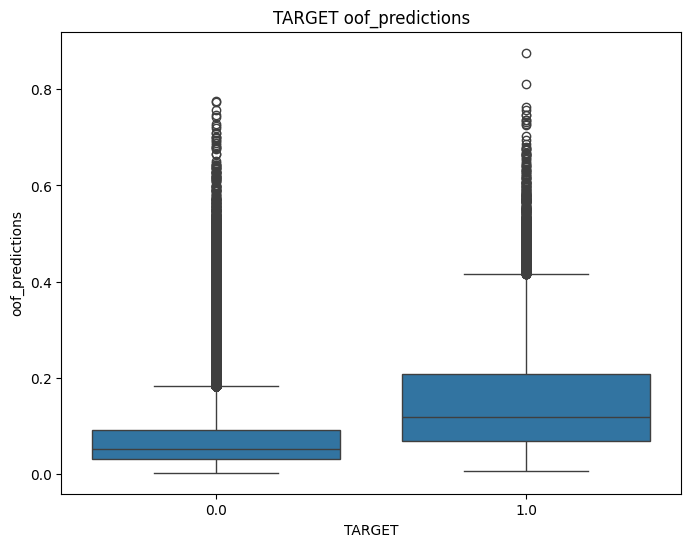

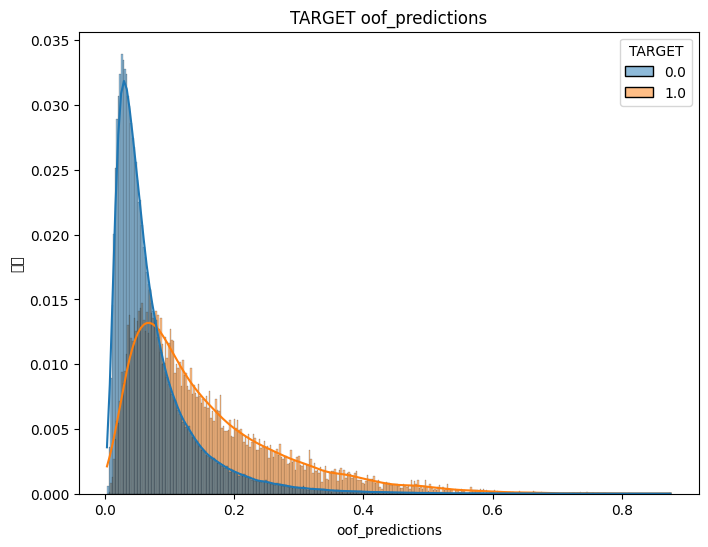

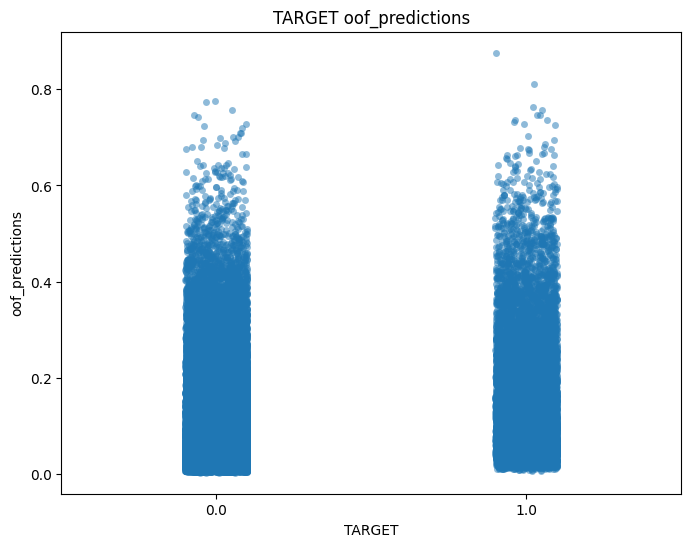

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# 可視化1: TARGETごとのoof_predictions分布を箱ひげ図で可視化
plt.figure(figsize=(8, 6))
sns.boxplot(x='TARGET', y='oof_predictions', data=train)
plt.title('TARGET oof_predictions')
plt.xlabel('TARGET')
plt.ylabel('oof_predictions')
plt.show()

# 可視化2: TARGETごとのoof_predictions分布をヒストグラム＋カーネル密度推定で可視化
plt.figure(figsize=(8, 6))
sns.histplot(data=train, x='oof_predictions', hue='TARGET', kde=True, stat='probability', common_norm=False)
plt.title('TARGET oof_predictions')
plt.xlabel('oof_predictions')
plt.ylabel('割合')
plt.show()

# 可視化3: TARGETとoof_predictionsの相関を散布図で可視化（分類だと情報量は少ないが例示）
# ※TARGETが0/1の二値であれば、x軸はoof_predictionsでy軸はTARGETで散布は限定的だが、傾向を見る参考になる
plt.figure(figsize=(8, 6))
sns.stripplot(x='TARGET', y='oof_predictions', data=train, jitter=True, alpha=0.5)
plt.title('TARGET oof_predictions')
plt.xlabel('TARGET')
plt.ylabel('oof_predictions')
plt.show()


In [38]:
train[list(best_features)].to_csv("train_008.csv")
test[list(best_features)].to_csv("test_008.csv")